# Bird Classification
---

You will use the [Bird Species dataset](https://www.kaggle.com/gpiosenka/100-bird-species) from Kaggle.

### The dataset contains:
- 525 bird species
- 84635 training images, 2625 test images(5 images per species)
- 2625 validation images (5 images per species)

Your goal is to build an image classification model with the best possible performance. You will work in a group, and at the end, as a group you will present your work to your instructor and classmates.

### Requirements:
- Choose 15 species that you want to train/classify
- Compile a classification model (you can choose any image classification model you want). Your accuracy should be at least 85%
- Make sure that your training, testing AND validation sets contain the same classes of species
- Save your final model, and use the validation set to evaluate its performance during the group presentation

In [36]:
import os
from glob import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50

from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split

In [37]:
# This is new to me, how we can access the zip file in the directory (check again)


# Define the path to your dataset
dataset_path = './'

# Get the list of all species (folders)

all_species = os.listdir(os.path.join(dataset_path, 'train'))

# Choose 15 species to work with (for example, the first 15)
selected_species = all_species[:15]

# Load image paths for the selected species
train_images = []
test_images = []
validation_images = []

for species in selected_species:
    train_images.extend(glob(os.path.join(dataset_path, 'train', species, '*.jpg')))
    test_images.extend(glob(os.path.join(dataset_path, 'test', species, '*.jpg')))
    validation_images.extend(glob(os.path.join(dataset_path, 'valid', species, '*.jpg')))
print('Total species :',len(all_species))
print(f"Loaded {len(train_images)} training images, {len(test_images)} test images, {len(validation_images)} validation images.")

Total species : 525
Loaded 2422 training images, 75 test images, 75 validation images.


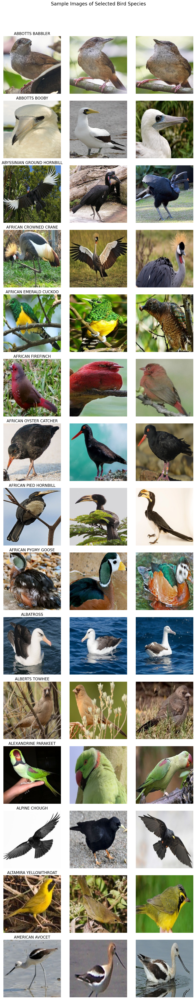

In [38]:
# Function to plot images from each species
def plot_species_images(species_list, train_images, num_images=3):
    fig, axes = plt.subplots(len(species_list), num_images, figsize=(num_images*4, len(species_list)*4))
    fig.suptitle('Sample Images of Selected Bird Species', fontsize=20)

    for i, species in enumerate(species_list):
        species_images = [img for img in train_images if species in img]
        for j in range(num_images):
            img = mpimg.imread(species_images[j])
            axes[i, j].imshow(img)
            axes[i, j].axis('off')
            if j == 0:
                axes[i, j].set_title(species, fontsize=16)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# Call the function to plot the images
plot_species_images(selected_species, train_images, num_images=3)

In [39]:
generator = keras.preprocessing.image.ImageDataGenerator(
    rescale=1.0/255,
    horizontal_flip=True,
    vertical_flip=True
)

In [40]:
training = generator.flow_from_directory(
    'train/',
    target_size=(224, 224),
    batch_size=32,
    classes=birds_classes,
    class_mode='categorical',
    seed=0,
)

validation = generator.flow_from_directory(
    'valid/',
    target_size=(224, 224),
    batch_size=32,
    classes=birds_classes,
    class_mode='categorical',
    seed=0,
)

testing = generator.flow_from_directory(
    'test/',
    target_size=(224, 224),
    batch_size=32,
    classes=birds_classes,
    class_mode='categorical',
    seed=0,
    shuffle=False
)

Found 2422 images belonging to 15 classes.
Found 75 images belonging to 15 classes.
Found 75 images belonging to 15 classes.


In [41]:
tf.config.list_logical_devices('GPU')

[]

In [42]:
with tf.device('/device:GPU:0'):
    classifier_1 = Sequential()

    # hidden layer 1
    classifier_1.add(Conv2D(32, kernel_size=(5, 5), activation='relu', input_shape=(224,224,3), padding='same'))
    classifier_1.add(MaxPooling2D(pool_size=(2, 2)))
    classifier_1.add(BatchNormalization())
    classifier_1.add(Dropout(0.25))

    # hidden layer 2
    classifier_1.add(Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same'))
    classifier_1.add(MaxPooling2D(pool_size=(2, 2)))
    classifier_1.add(BatchNormalization())
    classifier_1.add(Dropout(0.25))

    # hidden layer 3
    classifier_1.add(Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same'))
    classifier_1.add(MaxPooling2D(pool_size=(2, 2)))
    classifier_1.add(BatchNormalization())
    classifier_1.add(Dropout(0.25))

    # hidden layer 4
    classifier_1.add(Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same'))
    classifier_1.add(MaxPooling2D(pool_size=(2, 2)))
    classifier_1.add(BatchNormalization())
    classifier_1.add(Dropout(0.25))


    # hidden layer 5
    classifier_1.add(Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same'))
    classifier_1.add(MaxPooling2D(pool_size=(2, 2)))


    classifier_1.add(Flatten())

    # output layer
    classifier_1.add(Dense(1024, activation='relu'))
    classifier_1.add(Dense(512, activation='relu'))
    classifier_1.add(Dense(15, activation='softmax'))

    classifier_1.compile(optimizer='adam',
                         loss='categorical_crossentropy',
                         metrics=['accuracy'])

classifier_1.summary()

C:\Users\info\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 224, 224, 32)   │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 112, 112, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 56, 56, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 28, 28, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 14, 14, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 14, 14, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1024)           │    25,691,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 15)             │         7,695 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 27,795,663 (106.03 MB)

 Trainable params: 27,794,703 (106.03 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
# It took me 1h30 to run this step
# High accuracy 88%

In [43]:
history_1 = classifier_1.fit(training, epochs=50, validation_data=validation)

Epoch 1/50


C:\Users\info\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


76/76 ━━━━━━━━━━━━━━━━━━━━ 263s 3s/step - accuracy: 0.0632 - loss: 22.3879 - val_accuracy: 0.0667 - val_loss: 2.7482
Epoch 2/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 225s 3s/step - accuracy: 0.1442 - loss: 2.5269 - val_accuracy: 0.0933 - val_loss: 2.8069
Epoch 3/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 235s 3s/step - accuracy: 0.2883 - loss: 2.1403 - val_accuracy: 0.1067 - val_loss: 2.7372
Epoch 4/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 265s 3s/step - accuracy: 0.4075 - loss: 1.7445 - val_accuracy: 0.0933 - val_loss: 3.3405
Epoch 5/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 209s 3s/step - accuracy: 0.4987 - loss: 1.4611 - val_accuracy: 0.1467 - val_loss: 3.3039
Epoch 6/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 246s 3s/step - accuracy: 0.5732 - loss: 1.2406 - val_accuracy: 0.1867 - val_loss: 2.7269
Epoch 7/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 229s 3s/step - accuracy: 0.6264 - loss: 1.1284 - val_accuracy: 0.3467 - val_loss: 1.8194
Epoch 8/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 222s 3s/step - accuracy: 0.6531 - loss: 0.9894 - val_accuracy: 0.2400 - val_loss: 2

In [44]:
# Convert summary to DataFrame
model_summary = pd.DataFrame(history_1.history)
model_summary.head()

,accuracy,loss,val_accuracy,val_loss
0,0.084641,10.050899,0.066667,2.748169
1,0.184145,2.449910,0.093333,2.806929
2,0.314203,2.030056,0.106667,2.737170
3,0.436829,1.667654,0.093333,3.340508
4,0.523121,1.408351,0.146667,3.303938


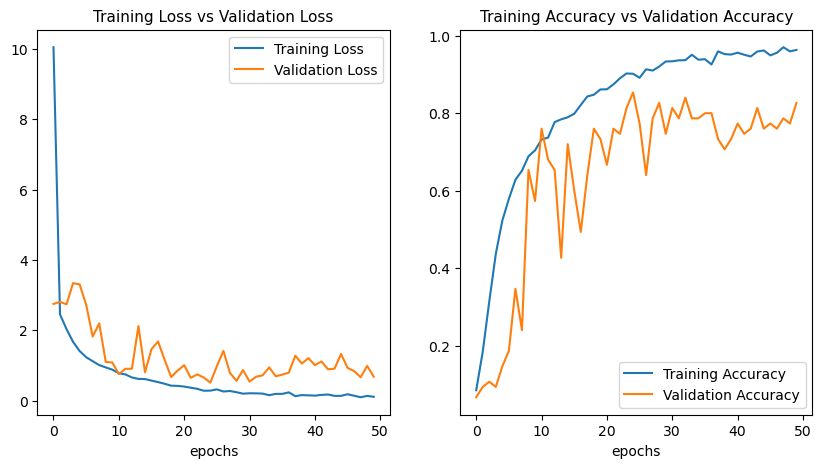

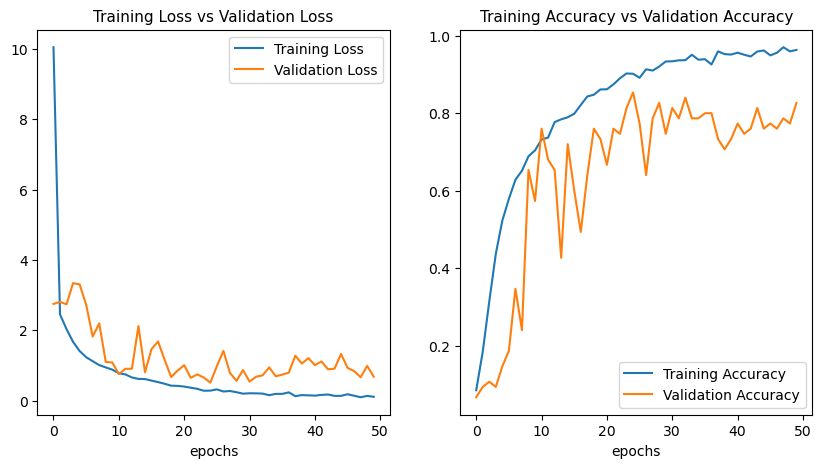

In [45]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize = (10,5))
ax1.plot(model_summary['loss'], label = 'Training Loss')
ax1.plot(model_summary['val_loss'], label = 'Validation Loss')
ax1.set_title('Training Loss vs Validation Loss', fontsize = 11)
ax1.set_xlabel('epochs')
ax1.legend()

ax2.plot(model_summary['accuracy'], label = 'Training Accuracy')
ax2.plot(model_summary['val_accuracy'], label = 'Validation Accuracy')
ax2.set_title('Training Accuracy vs Validation Accuracy', fontsize = 11)
ax2.set_xlabel('epochs')
ax2.legend();

fig

In [46]:
predictions = np.argmax(classifier_1.predict(testing),axis=1)

print(classification_report(testing.classes, predictions, target_names = birds_classes))

C:\Users\info\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 672ms/step
                            precision    recall  f1-score   support

           ABBOTTS BABBLER       1.00      0.40      0.57         5
             ABBOTTS BOOBY       0.80      0.80      0.80         5
ABYSSINIAN GROUND HORNBILL       0.83      1.00      0.91         5
     AFRICAN CROWNED CRANE       0.75      0.60      0.67         5
    AFRICAN EMERALD CUCKOO       0.83      1.00      0.91         5
         AFRICAN FIREFINCH       0.83      1.00      0.91         5
    AFRICAN OYSTER CATCHER       1.00      1.00      1.00         5
     AFRICAN PIED HORNBILL       0.75      0.60      0.67         5
       AFRICAN PYGMY GOOSE       1.00      1.00      1.00         5
                 ALBATROSS       1.00      1.00      1.00         5
            ALBERTS TOWHEE       0.71      1.00      0.83         5
      ALEXANDRINE PARAKEET       1.00      1.00      1.00         5
             ALPINE CHOUGH       0.83      1.00      0.91         5
     ALT

In [ ]:
# It took me 4h10 to run this step
# Low accuracy 81 %

In [47]:
history_2 = classifier_1.fit(training, epochs=100, validation_data=validation)

Epoch 1/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 196s 3s/step - accuracy: 0.9773 - loss: 0.0770 - val_accuracy: 0.6667 - val_loss: 2.5975
Epoch 2/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 189s 2s/step - accuracy: 0.9500 - loss: 0.1457 - val_accuracy: 0.7467 - val_loss: 0.7881
Epoch 3/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 192s 3s/step - accuracy: 0.9636 - loss: 0.1043 - val_accuracy: 0.7733 - val_loss: 0.9857
Epoch 4/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 188s 2s/step - accuracy: 0.9534 - loss: 0.1660 - val_accuracy: 0.7867 - val_loss: 1.1235
Epoch 5/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 188s 2s/step - accuracy: 0.9502 - loss: 0.1591 - val_accuracy: 0.8267 - val_loss: 0.8327
Epoch 6/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 194s 3s/step - accuracy: 0.9592 - loss: 0.1020 - val_accuracy: 0.8400 - val_loss: 0.8448
Epoch 7/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 189s 2s/step - accuracy: 0.9383 - loss: 0.2298 - val_accuracy: 0.7467 - val_loss: 1.0813
Epoch 8/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 189s 2s/step - accuracy: 0.9572 - loss: 0.1292 - val_accuracy: 0.

In [50]:
# Convert summary to DataFrame
model_summary2 = pd.DataFrame(history_2.history)
model_summary2.head()

,accuracy,loss,val_accuracy,val_loss
0,0.966969,0.093151,0.666667,2.597488
1,0.954583,0.125796,0.746667,0.788062
2,0.956235,0.131428,0.773333,0.985677
3,0.954996,0.166305,0.786667,1.123456
4,0.954996,0.138403,0.826667,0.832702


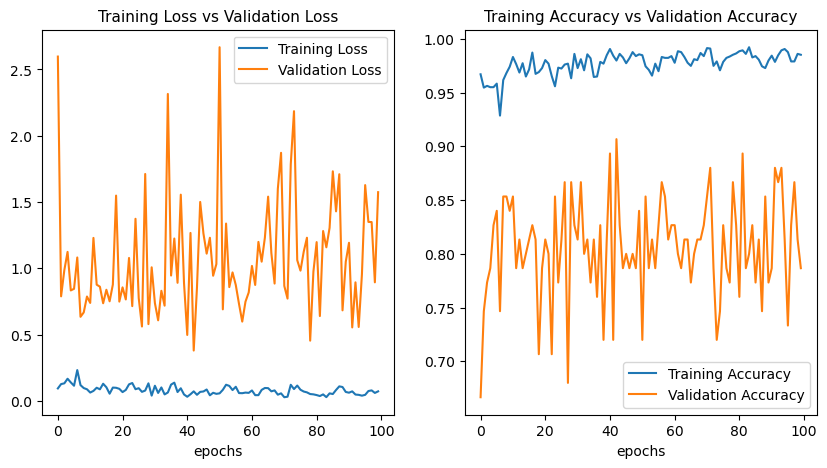

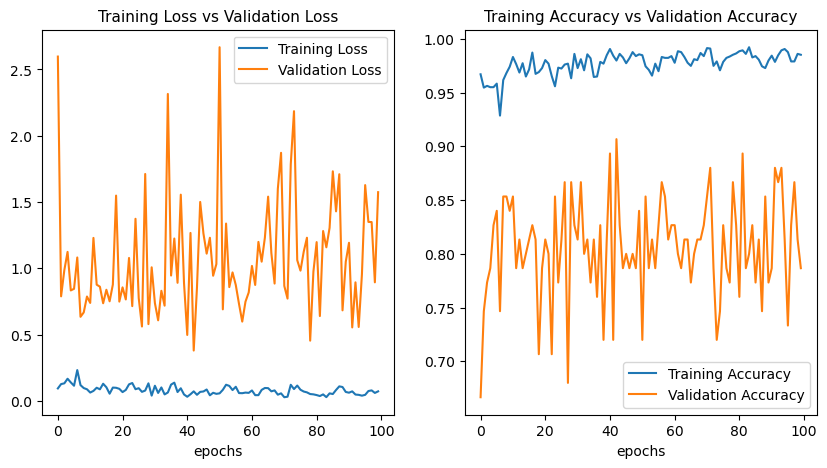

In [49]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize = (10,5))
ax1.plot(model_summary2['loss'], label = 'Training Loss')
ax1.plot(model_summary2['val_loss'], label = 'Validation Loss')
ax1.set_title('Training Loss vs Validation Loss', fontsize = 11)
ax1.set_xlabel('epochs')
ax1.legend()

ax2.plot(model_summary2['accuracy'], label = 'Training Accuracy')
ax2.plot(model_summary2['val_accuracy'], label = 'Validation Accuracy')
ax2.set_title('Training Accuracy vs Validation Accuracy', fontsize = 11)
ax2.set_xlabel('epochs')
ax2.legend();

fig

In [51]:
predictions = np.argmax(classifier_1.predict(testing),axis=1)

print(classification_report(testing.classes, predictions, target_names = birds_classes))

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 332ms/step
                            precision    recall  f1-score   support

           ABBOTTS BABBLER       1.00      0.40      0.57         5
             ABBOTTS BOOBY       0.40      0.40      0.40         5
ABYSSINIAN GROUND HORNBILL       0.71      1.00      0.83         5
     AFRICAN CROWNED CRANE       1.00      0.60      0.75         5
    AFRICAN EMERALD CUCKOO       1.00      1.00      1.00         5
         AFRICAN FIREFINCH       0.83      1.00      0.91         5
    AFRICAN OYSTER CATCHER       1.00      0.80      0.89         5
     AFRICAN PIED HORNBILL       1.00      0.80      0.89         5
       AFRICAN PYGMY GOOSE       1.00      1.00      1.00         5
                 ALBATROSS       0.75      0.60      0.67         5
            ALBERTS TOWHEE       0.42      1.00      0.59         5
      ALEXANDRINE PARAKEET       1.00      1.00      1.00         5
             ALPINE CHOUGH       1.00      1.00      1.00         5
     ALT